# **Hacking the Dating**

## Members:

* Daniel Fernando Moreno Cerón
* Daniel Esteban Pérez Bohorquez
* Jefer Alexis Gonzalez Romero
* Juan Felipe Vivas Manrique

# Get Our Data again to test Data Imputation

In [3]:
!gdown 1qr3nBZPdy4XHLiVQ7cfFYs07CCRY8flM

Downloading...
From: https://drive.google.com/uc?id=1qr3nBZPdy4XHLiVQ7cfFYs07CCRY8flM
To: /content/Speed Dating Data.csv
100% 5.19M/5.19M [00:00<00:00, 21.4MB/s]


In [140]:
# Import data analysis modules
import numpy as np
import pandas as pd
# Import visualization modules
import matplotlib.pyplot as plt
import seaborn as sns
import chardet
%matplotlib inline

dating_df = pd.read_csv('Speed Dating Data.csv', encoding="ISO-8859-1")
dating_df

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,552,22.0,1,44,2,21,22,14,10.0,5,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0
8374,552,22.0,1,44,2,21,22,13,10.0,4,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0
8375,552,22.0,1,44,2,21,22,19,10.0,10,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0
8376,552,22.0,1,44,2,21,22,3,10.0,16,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0


# Descriptive statistics

In [141]:
statistics = dating_df.describe()
statistics

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
count,8378.000000,8377.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,6532.000000,8378.000000,...,3974.000000,3974.000000,3974.000000,3974.000000,3974.000000,2016.000000,2016.000000,2016.000000,2016.000000,2016.000000
mean,283.675937,8.960248,0.500597,17.327166,1.828837,11.350919,16.872046,9.042731,9.295775,8.927668,...,7.240312,8.093357,8.388777,7.658782,7.391545,6.810020,7.615079,7.932540,7.155258,7.048611
std,158.583367,5.491329,0.500029,10.940735,0.376673,5.995903,4.358458,5.514939,5.650199,5.477009,...,1.576596,1.610309,1.459094,1.744670,1.961417,1.507341,1.504551,1.340868,1.672787,1.717988
min,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,1.000000,...,2.000000,2.000000,3.000000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000
25%,154.000000,4.000000,0.000000,8.000000,2.000000,7.000000,14.000000,4.000000,4.000000,4.000000,...,7.000000,7.000000,8.000000,7.000000,6.000000,6.000000,7.000000,7.000000,6.000000,6.000000
50%,281.000000,8.000000,1.000000,16.000000,2.000000,11.000000,18.000000,8.000000,9.000000,8.000000,...,7.000000,8.000000,8.000000,8.000000,8.000000,7.000000,8.000000,8.000000,7.000000,7.000000
75%,407.000000,13.000000,1.000000,26.000000,2.000000,15.000000,20.000000,13.000000,14.000000,13.000000,...,8.000000,9.000000,9.000000,9.000000,9.000000,8.000000,9.000000,9.000000,8.000000,8.000000
max,552.000000,22.000000,1.000000,44.000000,2.000000,21.000000,22.000000,22.000000,22.000000,22.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,10.000000,10.000000,10.000000,10.000000,10.000000


# Visualize

We select some columns that we believe are relevant to do the analysis

In [142]:
selected_columns = ['gender', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1', 'attr_o', 'pf_o_att', 'sinc_o', 'pf_o_sin', 'intel_o', 'pf_o_int', 'match', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'dec_o', 'pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'dec_o', 'race', 'income', 'imprelig', 'career_c', 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1']

## Correlation heatmap

<ipython-input-143-58f888abdb8a>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dating_df[selected_columns].corr(), vmax=0.6, square=True, annot=True)


<Axes: >

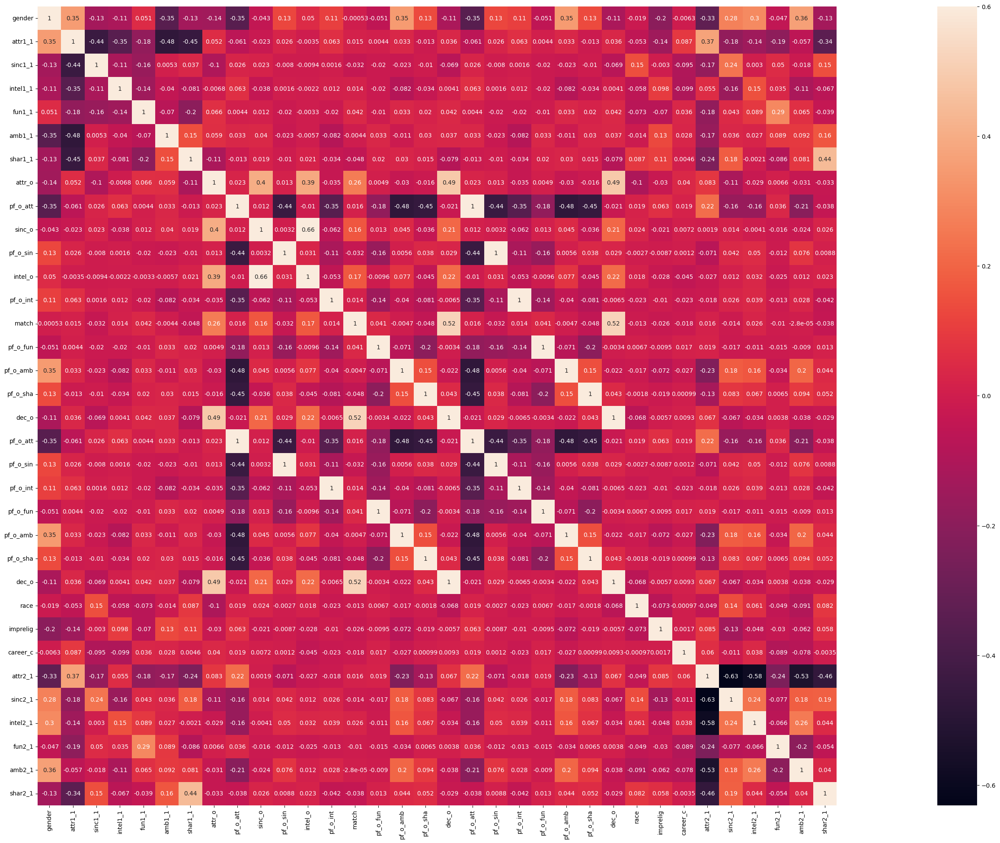

In [143]:
plt.figure(figsize=(60,24))
sns.heatmap(dating_df[selected_columns].corr(), vmax=0.6, square=True, annot=True)

## Missing data

<Axes: >

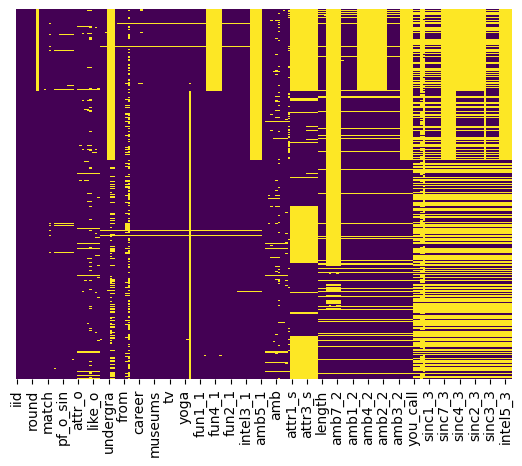

In [144]:
sns.heatmap(dating_df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

## Data distribution

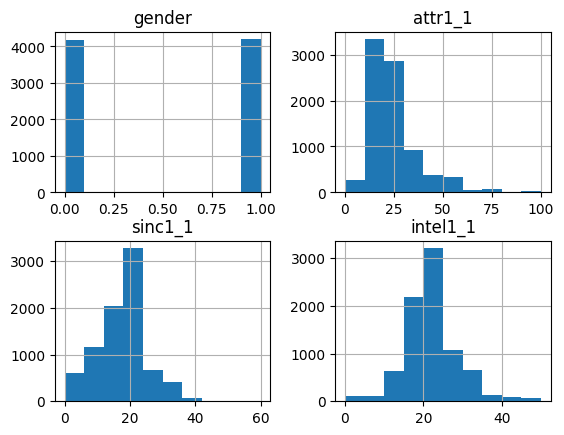

In [145]:
dating_df[selected_columns[0:4]].hist()
plt.show()

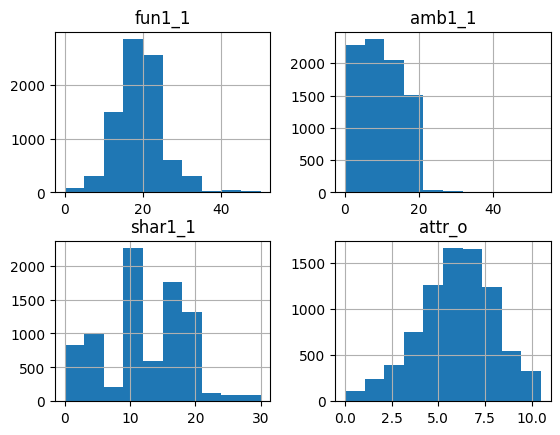

In [146]:
dating_df[selected_columns[4:8]].hist()
plt.show()

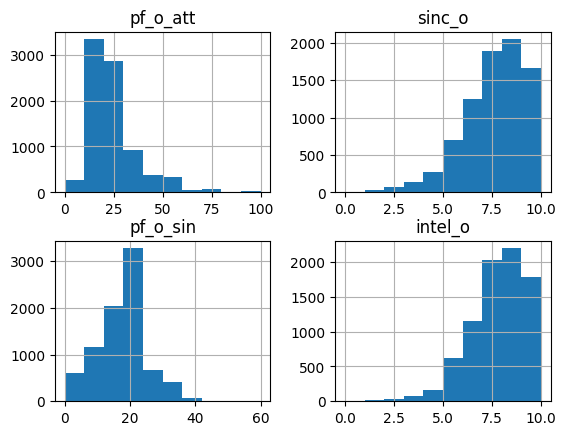

In [147]:
dating_df[selected_columns[8:12]].hist()
plt.show()

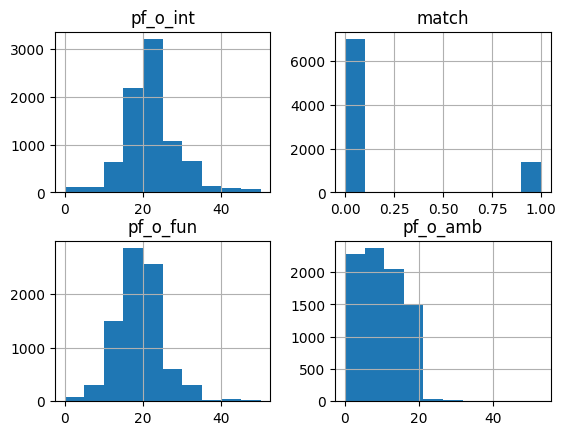

In [148]:
dating_df[selected_columns[12:16]].hist()
plt.show()

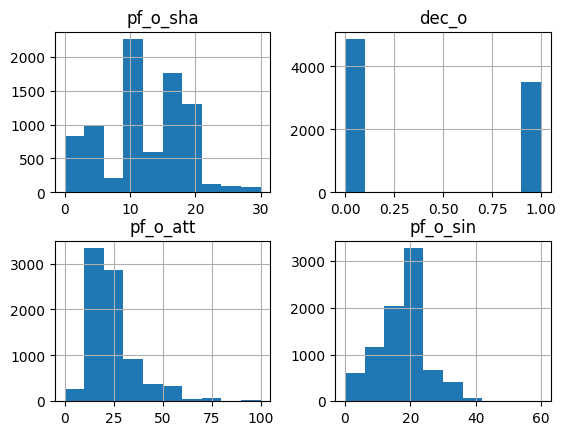

In [149]:
dating_df[selected_columns[16:20]].hist()
plt.show()

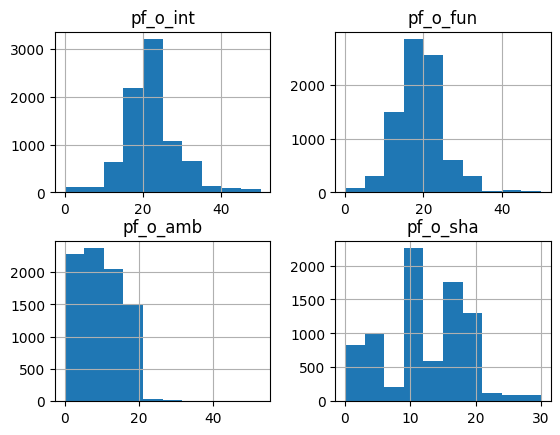

In [150]:
dating_df[selected_columns[20:24]].hist()
plt.show()

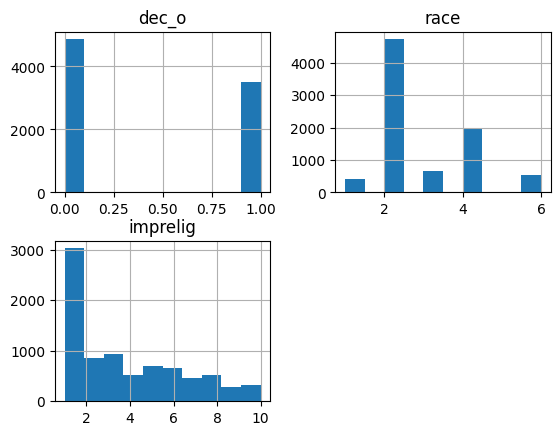

In [151]:
dating_df[selected_columns[24:28]].hist()
plt.show()

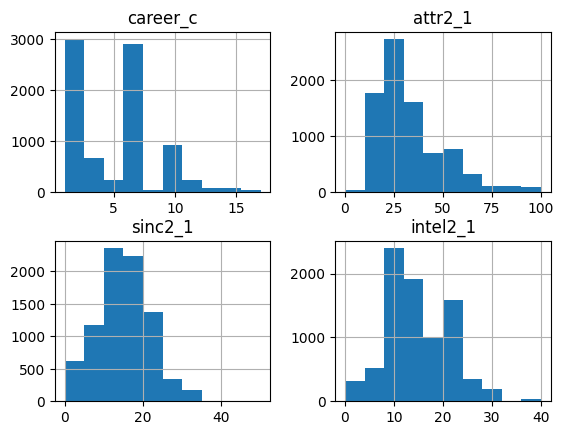

In [152]:
dating_df[selected_columns[28:32]].hist()
plt.show()

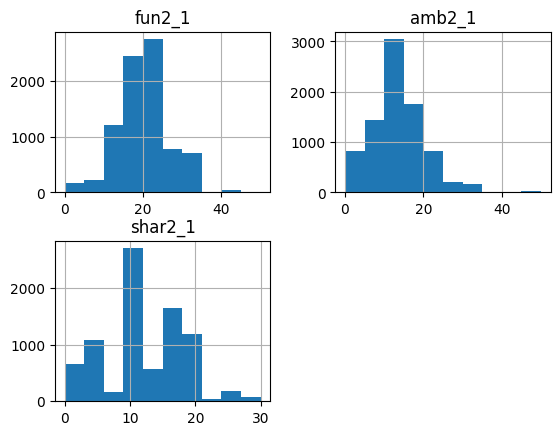

In [153]:
dating_df[selected_columns[32:]].hist()
plt.show()

## Pair plot

In [ ]:
sns.pairplot(dating_df, vars=selected_columns)
plt.show()

## Line plot

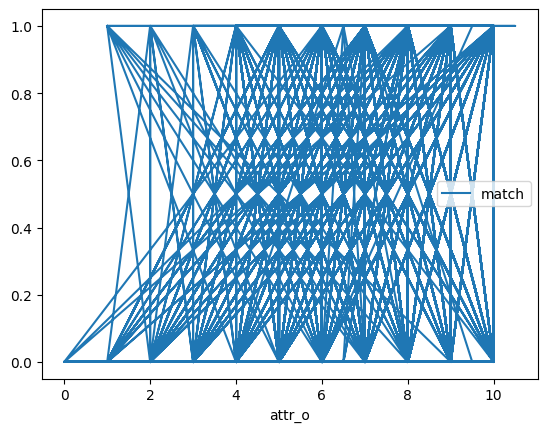

In [6]:
dating_df.plot.line(x="attr_o", y="match")
plt.show()

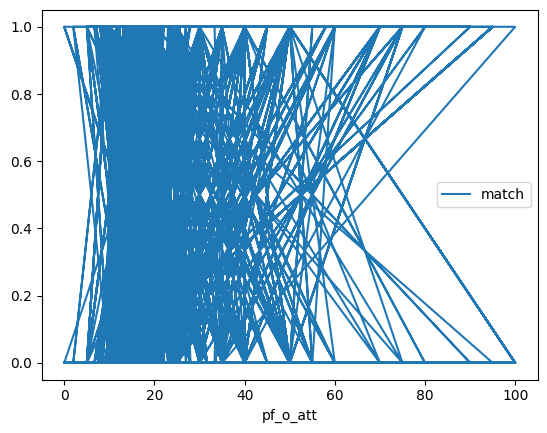

In [8]:
dating_df.plot.line(x="pf_o_att", y="match")
plt.show()

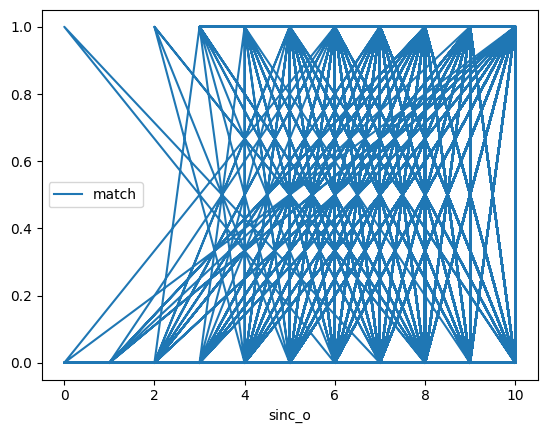

In [9]:
dating_df.plot.line(x="sinc_o", y="match")
plt.show()

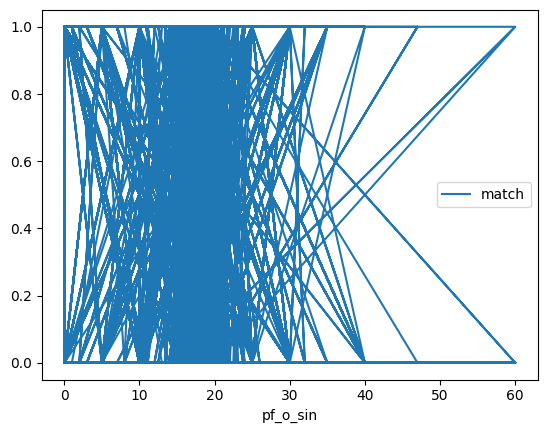

In [11]:
dating_df.plot.line(x="pf_o_sin", y="match")
plt.show()

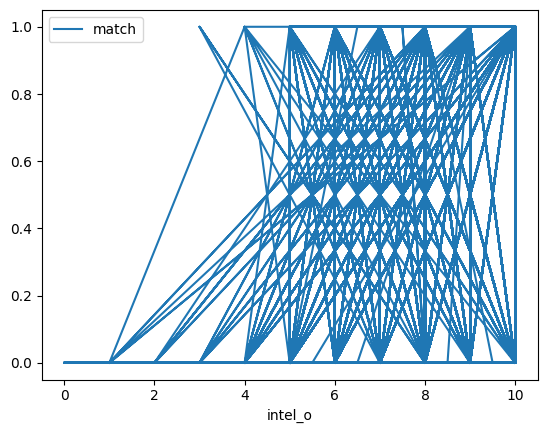

In [17]:
dating_df.plot.line(x="intel_o", y="match")
plt.show()

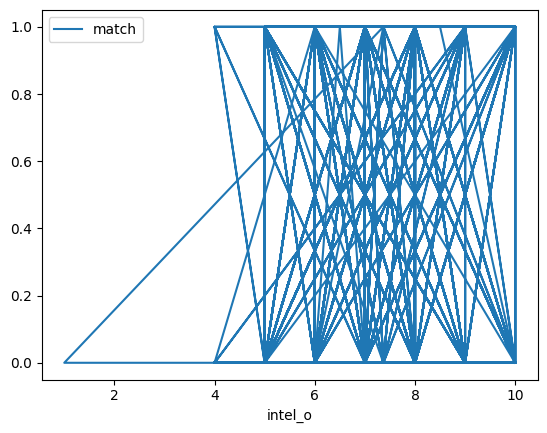

In [69]:
dating_df.plot.line(x="intel_o", y="match")
plt.show()

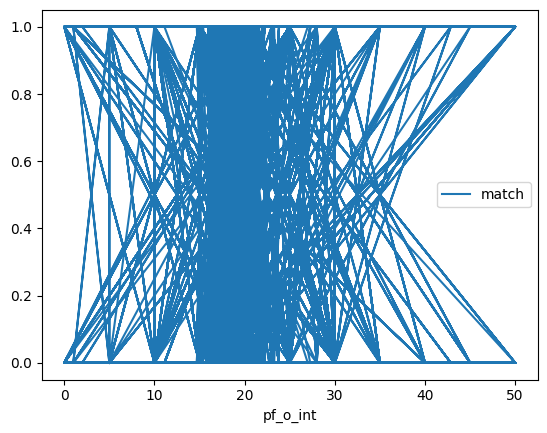

In [18]:
dating_df.plot.line(x="pf_o_int", y="match")
plt.show()

## Bar plot

<Axes: xlabel='attr_o', ylabel='match'>

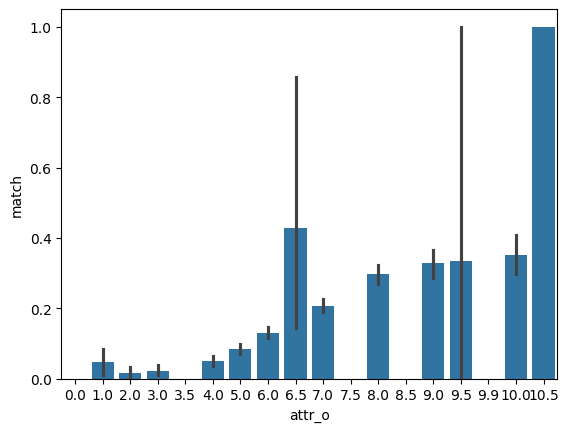

In [22]:
sns.barplot(x='attr_o', y='match', data=dating_df)

<Axes: xlabel='pf_o_att', ylabel='match'>

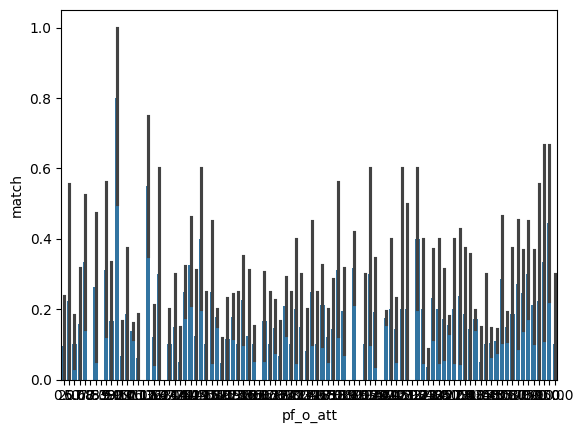

In [25]:
sns.barplot(x='pf_o_att', y='match', data=dating_df)

<Axes: xlabel='sinc_o', ylabel='match'>

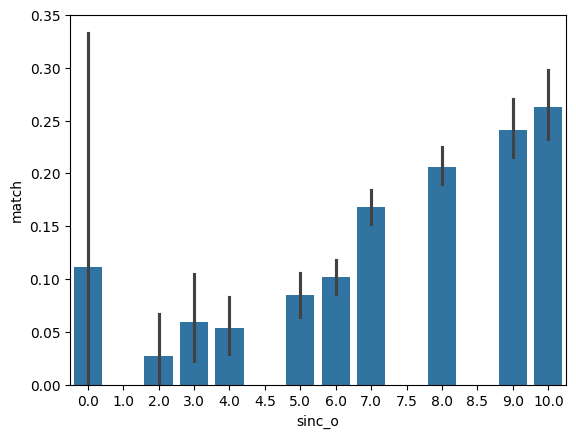

In [26]:
sns.barplot(x='sinc_o', y='match', data=dating_df)

<Axes: xlabel='pf_o_sin', ylabel='match'>

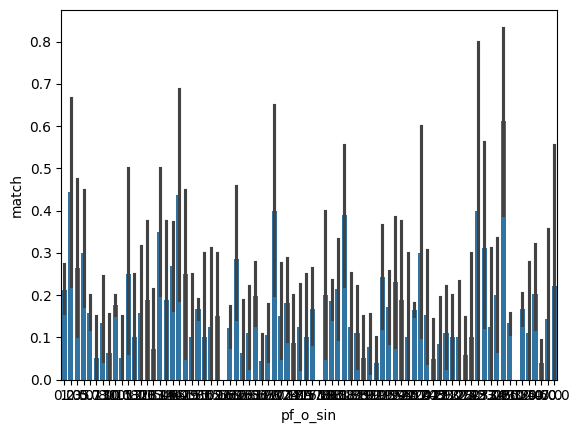

In [27]:
sns.barplot(x='pf_o_sin', y='match', data=dating_df)

<Axes: xlabel='intel_o', ylabel='match'>

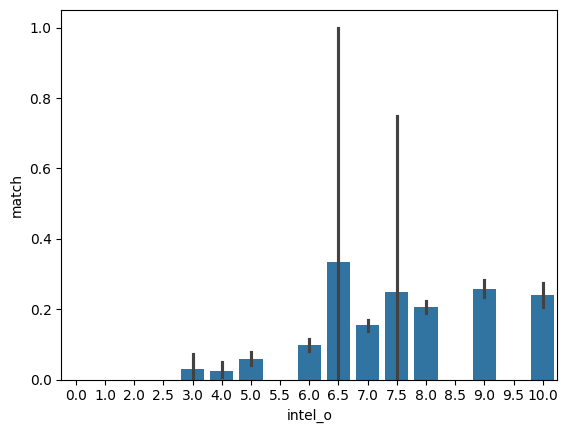

In [32]:
sns.barplot(x='intel_o', y='match', data=dating_df)

<Axes: xlabel='pf_o_int', ylabel='match'>

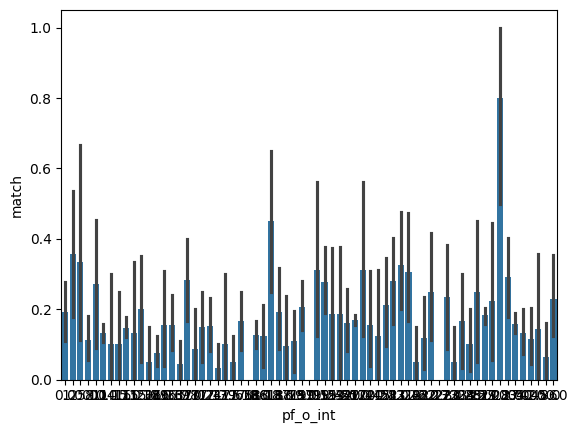

In [33]:
sns.barplot(x='pf_o_int', y='match', data=dating_df)

## Box plot

<Axes: xlabel='match', ylabel='attr_o'>

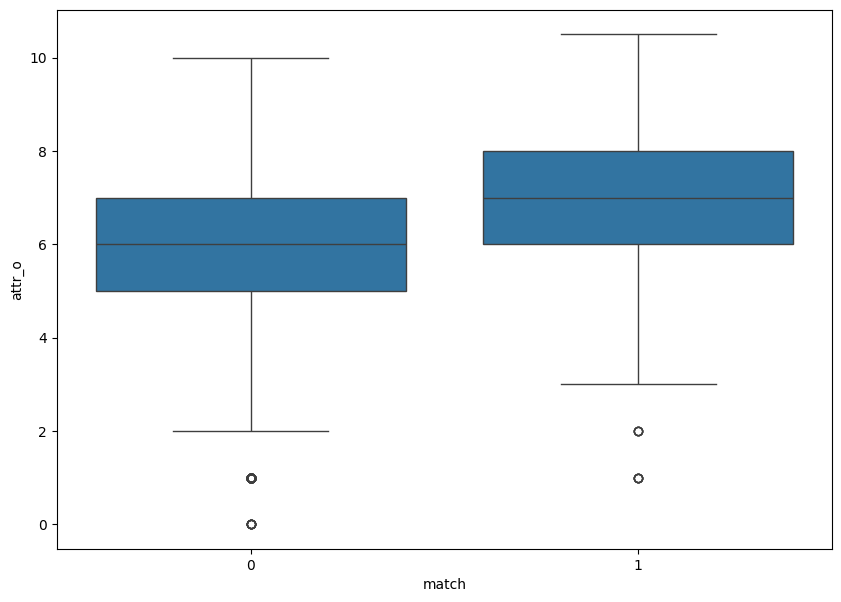

In [158]:
plt.figure(figsize=(10,7))
sns.boxplot(x='match',y='attr_o',data=dating_df)

<Axes: xlabel='match', ylabel='pf_o_att'>

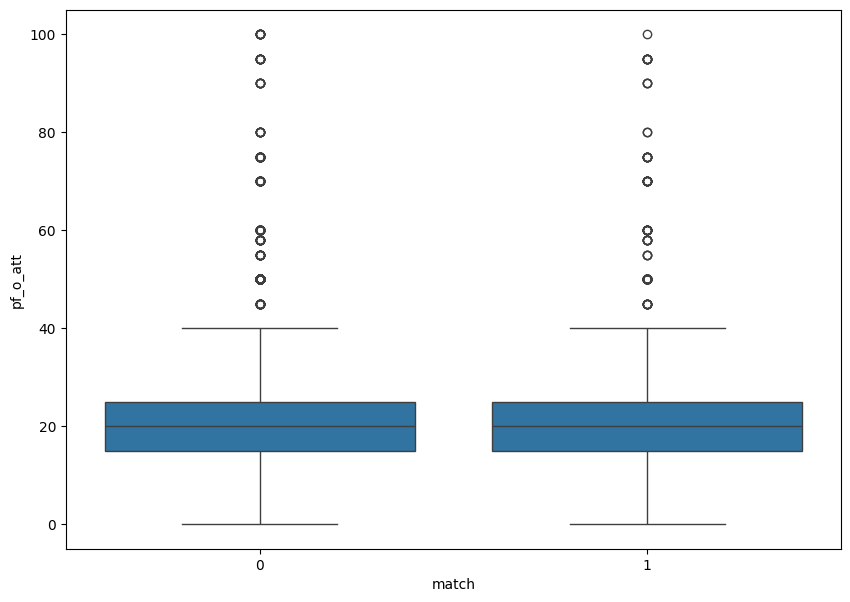

In [159]:
plt.figure(figsize=(10,7))
sns.boxplot(x='match',y='pf_o_att',data=dating_df)

<Axes: xlabel='match', ylabel='sinc_o'>

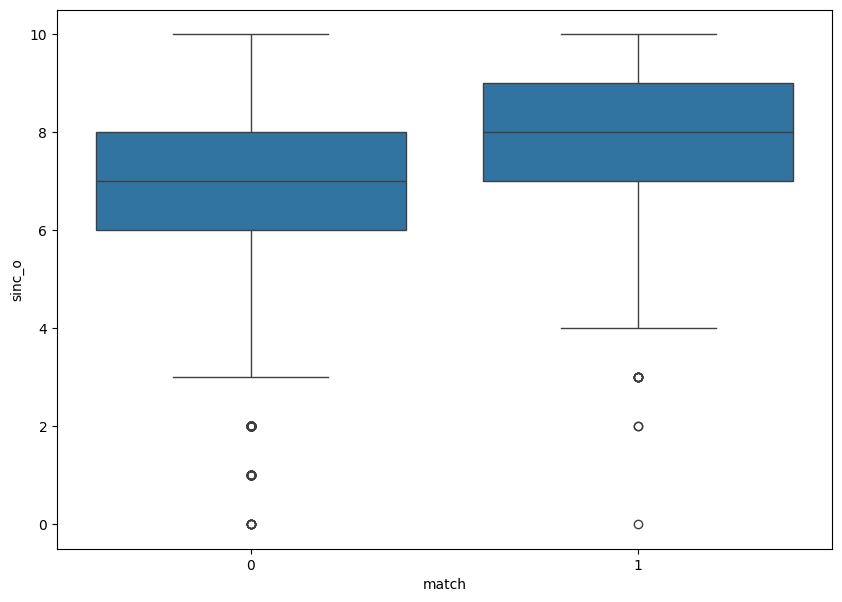

In [160]:
plt.figure(figsize=(10,7))
sns.boxplot(x='match',y='sinc_o',data=dating_df)

<Axes: xlabel='match', ylabel='pf_o_sin'>

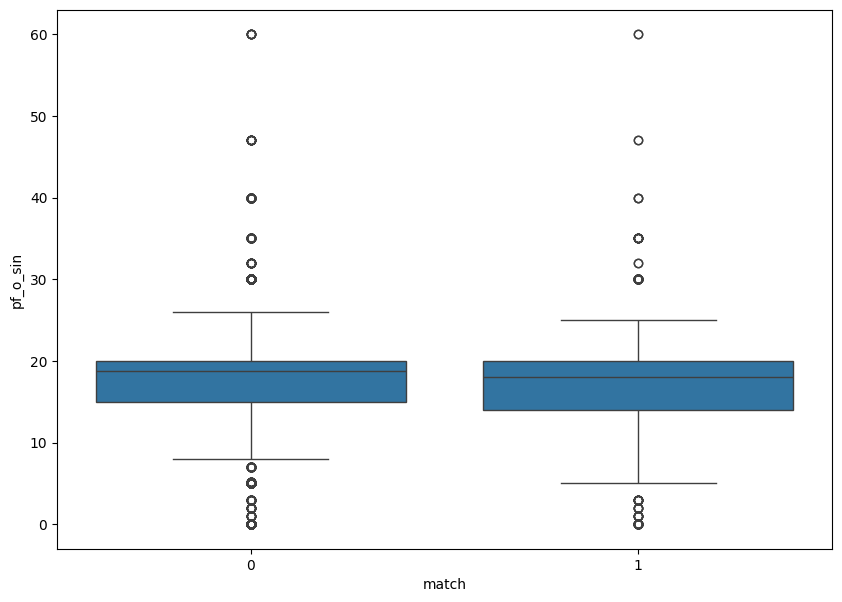

In [161]:
plt.figure(figsize=(10,7))
sns.boxplot(x='match',y='pf_o_sin',data=dating_df)

<Axes: xlabel='match', ylabel='intel_o'>

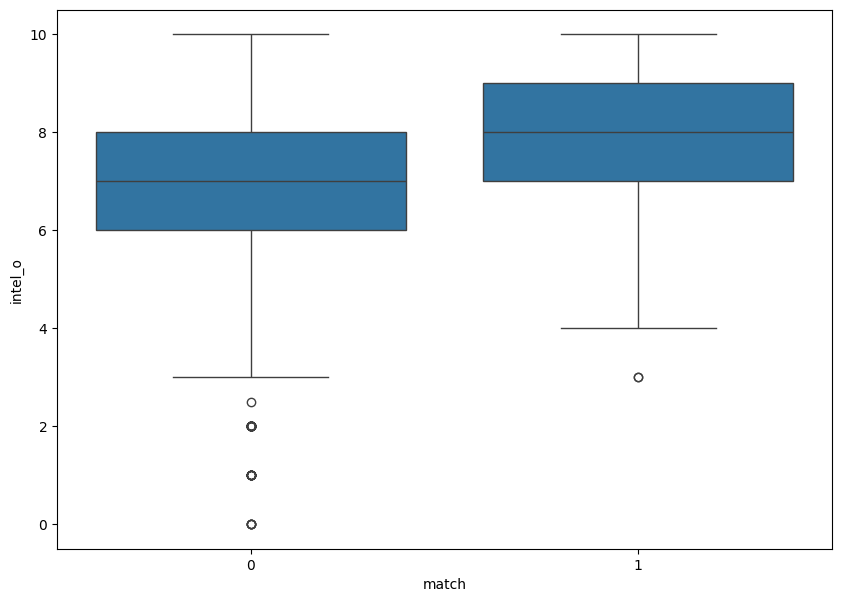

In [162]:
plt.figure(figsize=(10,7))
sns.boxplot(x='match',y='intel_o',data=dating_df)

<Axes: xlabel='match', ylabel='pf_o_int'>

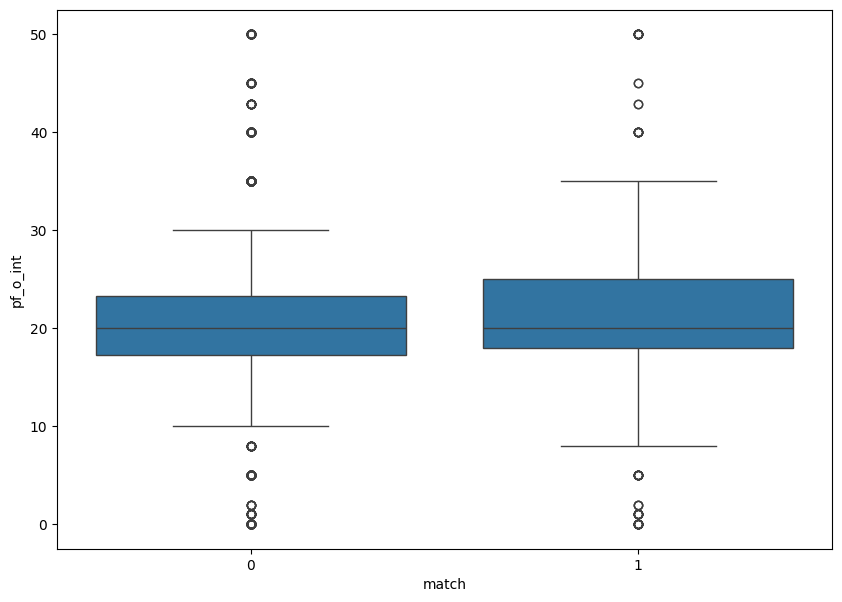

In [164]:
plt.figure(figsize=(10,7))
sns.boxplot(x='match',y='pf_o_int',data=dating_df)

# Clean the data - Noise detection and elimination

## Duplicates

In [166]:
print(dating_df.duplicated().sum())
dating_df.drop_duplicates(inplace=True)

0


## Count of missing values

In [167]:
missing_values = dating_df.isnull().sum()
missing_values

iid            0
id             1
gender         0
idg            0
condtn         0
            ... 
attr5_3     6362
sinc5_3     6362
intel5_3    6362
fun5_3      6362
amb5_3      6362
Length: 195, dtype: int64

## Count of present values

In [168]:
present_values = dating_df.count()
present_values

iid         8378
id          8377
gender      8378
idg         8378
condtn      8378
            ... 
attr5_3     2016
sinc5_3     2016
intel5_3    2016
fun5_3      2016
amb5_3      2016
Length: 195, dtype: int64

## Missing Values

In [177]:
dating_df.fillna(dating_df.mean(), inplace=True)

<ipython-input-177-cd9f5fcdeefd>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  dating_df.fillna(dating_df.mean(), inplace=True)


## Outliers

In [170]:
def detectar_outliers(df, col_name):
  if (df[col_name].dtype != object):
    q1 = np.percentile(df[col_name], 25)
    q3 = np.percentile(df[col_name], 75)
    IQR = q3 - q1
    min_outlier = q1 - (3 * IQR)
    max_outlier = q3 + (3 * IQR)
    outliers = df[df[col_name] < min_outlier]
    outliers = outliers.append(df[df[col_name] > max_outlier])
    for i in range(len(outliers)):
      outliers.loc[i, "valor_cercano"] = df[col_name].iloc[(outliers.index[i] - 1) if outliers.index[i] > 0 else (outliers.index[i] + 1)]
    return outliers

columnas = list(dating_df)
for col_name in columnas:
  outliers = detectar_outliers(dating_df.copy(), col_name)
  if not outliers is None and not outliers.empty:
    print(f"Valores atípicos en la columna {col_name}:")
    print(len(outliers))
    dating_df.loc[outliers.index, col_name] = outliers["valor_cercano"]


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna condtn:
2468


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna match:
2541
Valores atípicos en la columna age_o:
52


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna pf_o_att:
386
Valores atípicos en la columna pf_o_sin:
196


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna pf_o_int:
332
Valores atípicos en la columna pf_o_fun:
126
Valores atípicos en la columna pf_o_amb:
20


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna intel_o:
241


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna met_o:
1421
Valores atípicos en la columna age:
52


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna goal:
796


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna movies:
36
Valores atípicos en la columna expnum:
1846
Valores atípicos en la columna attr1_1:
388


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc1_1:
198
Valores atípicos en la columna intel1_1:
342


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun1_1:
140
Valores atípicos en la columna amb1_1:
20


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr4_1:
282


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc4_1:
384
Valores atípicos en la columna intel4_1:
28


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb4_1:
534
Valores atípicos en la columna shar4_1:
36
Valores atípicos en la columna sinc2_1:
20
Valores atípicos en la columna fun2_1:
110
Valores atípicos en la columna amb2_1:
42


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna sinc3_1:
288
Valores atípicos en la columna intel3_1:
38


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr5_1:
6390


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc5_1:
7129


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel5_1:
174


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun5_1:
332


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb5_1:
236


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel:
242


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna match_es:
106


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr1_s:
2568


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc1_s:
6079


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel1_s:
3514


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun1_s:
5404


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb1_s:
4574


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna shar1_s:
6079


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr3_s:
4902


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc3_s:
4991


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel3_s:
3056


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun3_s:
4055


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb3_s:
2928


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr7_2:
3968


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc7_2:
3910


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel7_2:
3968


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun7_2:
3968


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb7_2:
3910


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna shar7_2:
3948


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr1_2:
456
Valores atípicos en la columna sinc1_2:
38
Valores atípicos en la columna intel1_2:
230


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun1_2:
154
Valores atípicos en la columna shar1_2:
44


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr4_2:
302
Valores atípicos en la columna sinc4_2:
42
Valores atípicos en la columna intel4_2:
60


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb4_2:
974
Valores atípicos en la columna shar4_2:
280


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr2_2:
414
Valores atípicos en la columna sinc2_2:
30


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun2_2:
1082
Valores atípicos en la columna amb2_2:
82


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr3_2:
262
Valores atípicos en la columna intel3_2:
72


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

Valores atípicos en la columna attr5_2:
5558


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc5_2:
1524


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel5_2:
5874


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun5_2:
4344


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb5_2:
4406


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna you_call:
412


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna them_cal:
5670


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna numdat_3:
2992


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna num_in_3:
1304


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr1_3:
1459


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc1_3:
5670


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel1_3:
3532


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun1_3:
5670


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb1_3:
4374


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna shar1_3:
4606


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr7_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc7_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel7_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun7_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb7_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna shar7_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr4_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc4_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel4_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun4_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb4_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna shar4_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr2_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc2_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel2_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun2_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb2_3:
5215


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna shar2_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr3_3:
4286


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc3_3:
4459


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel3_3:
1534


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun3_3:
2182


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb3_3:
5670


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna attr5_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna sinc5_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna intel5_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna fun5_3:
4032


<ipython-input-170-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])


Valores atípicos en la columna amb5_3:
4032


## Data type

In [173]:
dating_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8378 entries, 0 to 8377
Columns: 195 entries, iid to amb5_3
dtypes: float64(176), int64(11), object(8)
memory usage: 12.8+ MB


## Unique values

In [174]:
dating_df.nunique()

iid         551
id           23
gender        2
idg          44
condtn        2
           ... 
attr5_3      10
sinc5_3      10
intel5_3      8
fun5_3       11
amb5_3       10
Length: 195, dtype: int64

## Minimum value - Maximum value

In [175]:
dating_df.describe()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
count,8378.000000,8378.000000,8378.000000,8378.000000,7344.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,...,6764.000000,6689.000000,7648.000000,7370.000000,6682.000000,6362.000000,6362.000000,6362.000000,6362.000000,6362.000000
mean,283.675937,8.960248,0.500597,17.327166,1.805828,11.350919,16.872046,9.042731,9.295775,8.927668,...,7.256901,8.100096,8.395455,7.654804,7.392480,6.810019,7.614386,7.930130,7.153728,7.049215
std,158.583367,5.491002,0.500029,10.940735,0.395589,5.995903,4.358458,5.514939,4.988952,5.477009,...,1.180215,1.212523,1.020016,1.232668,1.486541,0.830757,0.829575,0.738277,0.923698,0.947369
min,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,5.000000,1.000000,1.000000,1.000000,...,2.000000,2.000000,3.000000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000
25%,154.000000,4.000000,0.000000,8.000000,2.000000,7.000000,14.000000,4.000000,6.000000,4.000000,...,7.000000,8.000000,8.388777,7.658782,7.000000,6.810020,7.615079,7.932540,7.155258,7.048611
50%,281.000000,8.000000,1.000000,16.000000,2.000000,11.000000,18.000000,8.000000,9.295775,8.000000,...,7.240312,8.093357,8.388777,7.658782,7.391545,6.810020,7.615079,7.932540,7.155258,7.048611
75%,407.000000,13.000000,1.000000,26.000000,2.000000,15.000000,20.000000,13.000000,12.000000,13.000000,...,7.240312,8.093357,8.388777,8.000000,8.000000,6.810020,7.615079,7.932540,7.155258,7.048611
max,552.000000,22.000000,1.000000,44.000000,2.000000,21.000000,22.000000,22.000000,22.000000,22.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,10.000000,10.000000,10.000000,10.000000,10.000000


# Data Quality Report

## Count of missing values

In [178]:
missing_values = dating_df.isnull().sum()
missing_values

iid         0
id          0
gender      0
idg         0
condtn      0
           ..
attr5_3     0
sinc5_3     0
intel5_3    0
fun5_3      0
amb5_3      0
Length: 195, dtype: int64

## Duplicates

In [179]:
print(dating_df.duplicated().sum())
dating_df.drop_duplicates(inplace=True)

0


## Outliers

In [181]:
def detectar_outliers(df, col_name):
  if (df[col_name].dtype != object):
    q1 = np.percentile(df[col_name], 25)
    q3 = np.percentile(df[col_name], 75)
    IQR = q3 - q1
    min_outlier = q1 - (3 * IQR)
    max_outlier = q3 + (3 * IQR)
    outliers = df[df[col_name] < min_outlier]
    outliers = outliers.append(df[df[col_name] > max_outlier])
    for i in range(len(outliers)):
      outliers.loc[i, "valor_cercano"] = df[col_name].iloc[(outliers.index[i] - 1) if outliers.index[i] > 0 else (outliers.index[i] + 1)]
    return outliers

columnas = list(dating_df)
for col_name in columnas:
  outliers = detectar_outliers(dating_df.copy(), col_name)
  if not outliers is None and not outliers.empty:
    print(f"Valores atípicos en la columna {col_name}:")
    print(len(outliers))
    dating_df.loc[outliers.index, col_name] = outliers["valor_cercano"]

<ipython-input-181-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-181-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-181-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-181-1f29ce8855ad>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(df[df[col_name] > max_outlier])
<ipython-input-181-1f29ce8855ad>:9: FutureWarning: The frame.append method is de

# Distribution and comparison between men and women

In [182]:
male_data = dating_df[dating_df["gender"] == 0]
female_data = dating_df[dating_df["gender"] == 1]

In [183]:
attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o']

In [184]:
male_data[attributes].describe()

,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o
count,4184.000000,4184.000000,4183.000000,4184.000000,4184.000000,4184.000000
mean,6.454859,7.248390,7.332496,6.515392,6.619131,5.533386
std,1.836212,1.583679,1.375550,1.801078,1.651016,1.969444
min,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000
25%,5.000000,6.000000,6.000000,5.000000,6.000000,5.000000
50%,6.190411,7.000000,7.000000,7.000000,6.778409,5.474870
75%,8.000000,8.000000,8.000000,8.000000,8.000000,7.000000
max,10.000000,10.000000,10.000000,11.000000,10.000000,10.000000


In [185]:
female_data[attributes].describe()

,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o
count,4194.000000,4194.000000,4194.000000,4194.000000,4194.000000,4194.000000
mean,5.926594,7.102298,7.538125,6.286079,6.937308,5.416494
std,1.975821,1.825546,1.399351,2.009575,1.762491,2.053969
min,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000
25%,5.000000,6.000000,7.000000,5.000000,6.000000,4.000000
50%,6.000000,7.000000,8.000000,6.400599,7.000000,5.474870
75%,7.000000,8.000000,8.000000,8.000000,8.000000,7.000000
max,10.500000,10.000000,10.000000,10.000000,10.000000,10.000000


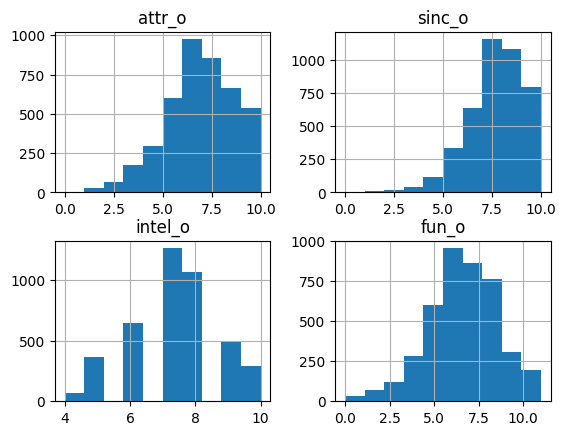

In [186]:
male_data[attributes[0:4]].hist()
plt.show()

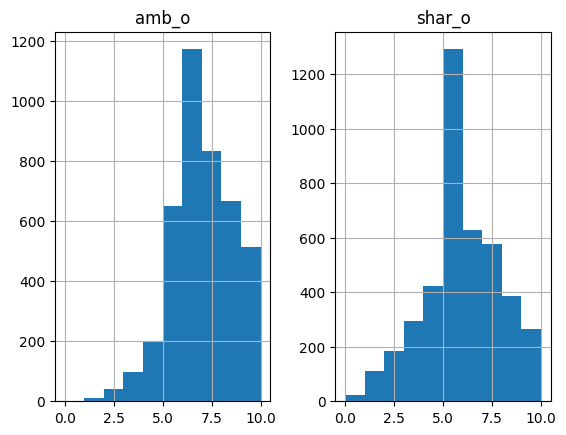

In [187]:
male_data[attributes[4:6]].hist()
plt.show()

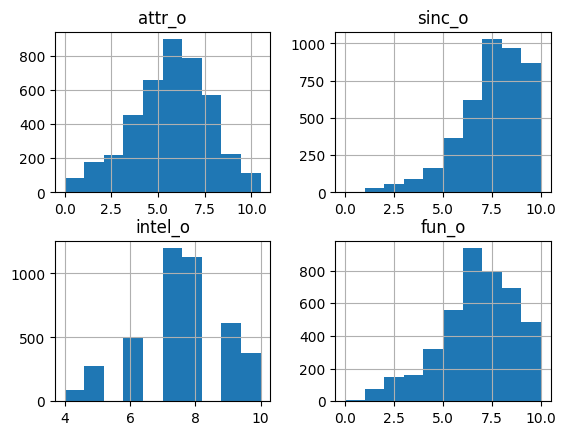

In [188]:
female_data[attributes[0:4]].hist()
plt.show()

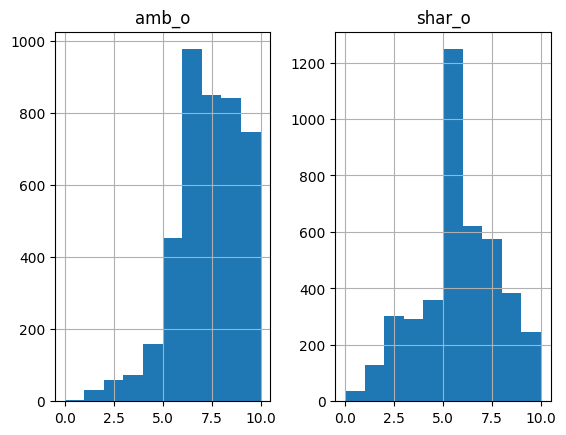

In [189]:
female_data[attributes[4:6]].hist()
plt.show()

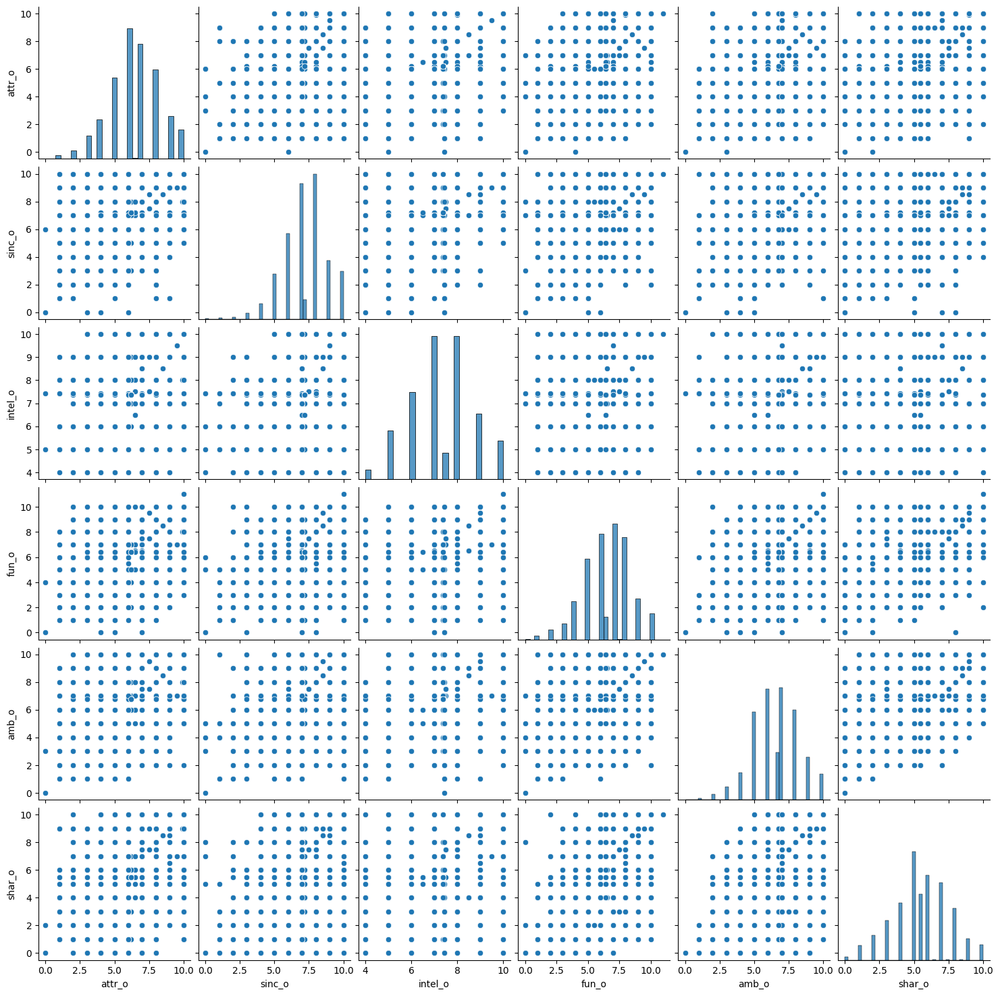

In [190]:
sns.pairplot(male_data, vars=attributes)
plt.show()

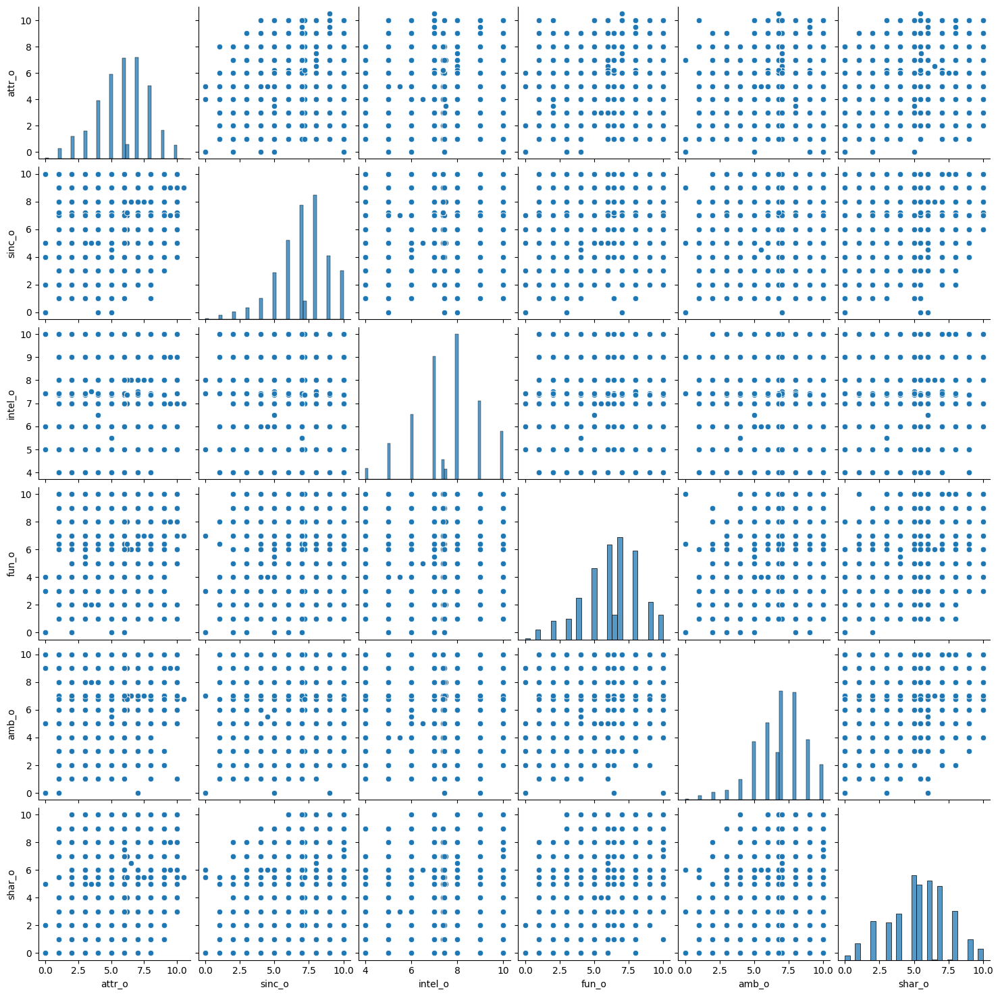

In [191]:
sns.pairplot(female_data, vars=attributes)
plt.show()

# Age repartition

In [192]:
age_dist = dating_df["age"].value_counts().reset_index(name="count")
age_dist.columns = ["age", "count"]
age_dist

,age,count
0,27.000000,1059
1,23.000000,894
2,26.000000,869
3,24.000000,853
4,25.000000,831
5,28.000000,747
6,22.000000,655
7,29.000000,590
8,30.000000,574
9,21.000000,281


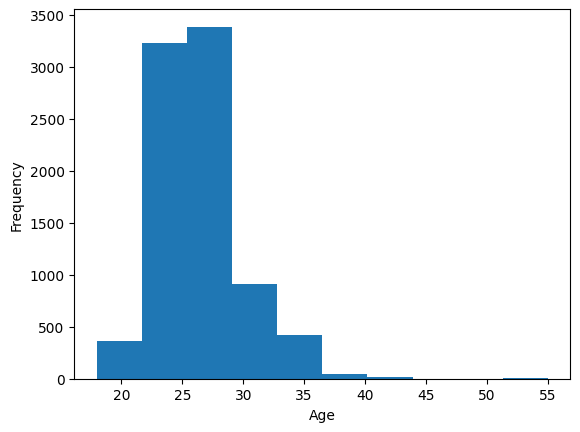

In [195]:
plt.hist(dating_df['age'])
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

## Study field repartition

In [196]:
field_dist = dating_df["field"].value_counts().reset_index(name="count")
field_dist.columns = ["field", "count"]
field_dist

,field,count
0,Business,521
1,MBA,468
2,Law,462
3,Social Work,378
4,International Affairs,252
...,...,...
254,Business (Finance & Marketing),6
255,Stats,6
256,MFA Poetry,6
257,marine geophysics,5


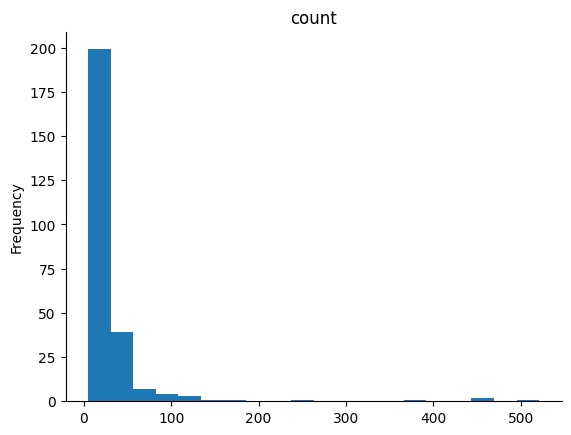

In [197]:
field_dist['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

# Career repartition

In [198]:
career_dist = dating_df["field_cd"].value_counts().reset_index(name="count")
career_dist.columns = ["career", "count"]
career_dist

,career,count
0,8.000000,1925
1,10.000000,993
2,5.000000,864
3,13.000000,709
4,3.000000,696
5,1.000000,665
6,9.000000,626
7,11.000000,468
8,6.000000,325
9,7.000000,241


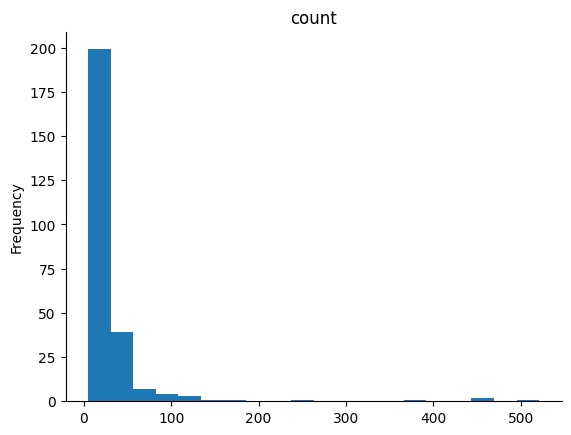

In [199]:
field_dist['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

# Race repartition

In [200]:
race_dist = dating_df["race"].value_counts().reset_index(name="count")
race_dist.columns = ["race", "count"]
race_dist

,race,count
0,2.000000,4727
1,4.000000,1982
2,3.000000,664
3,6.000000,522
4,1.000000,420
5,2.757186,63


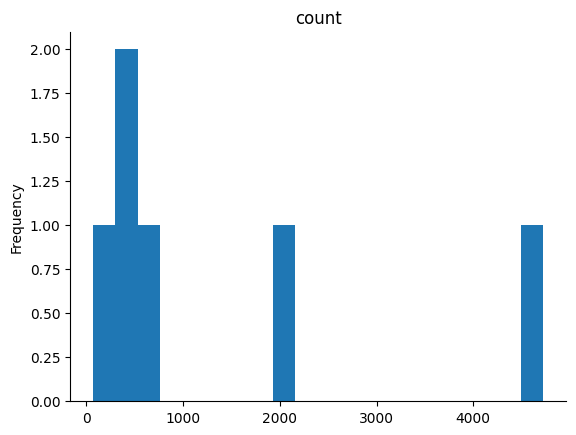

In [201]:
race_dist['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

# What influences love at first sight?

<Axes: >

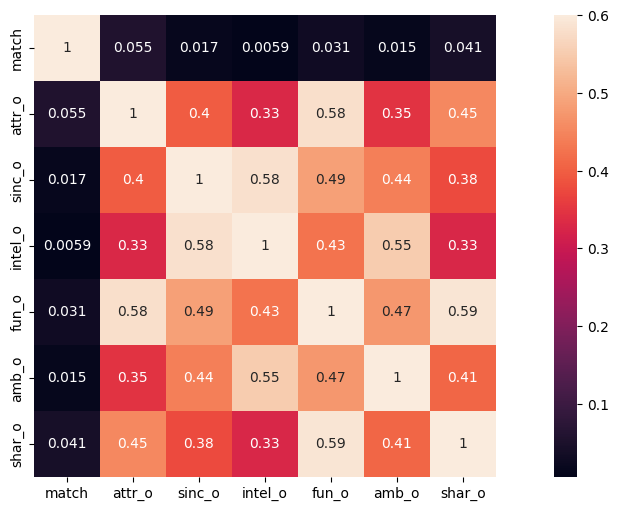

In [202]:
plt.figure(figsize=(15,6))
sns.heatmap(dating_df[["match"] + attributes].corr(), vmax=0.6, square=True, annot=True)

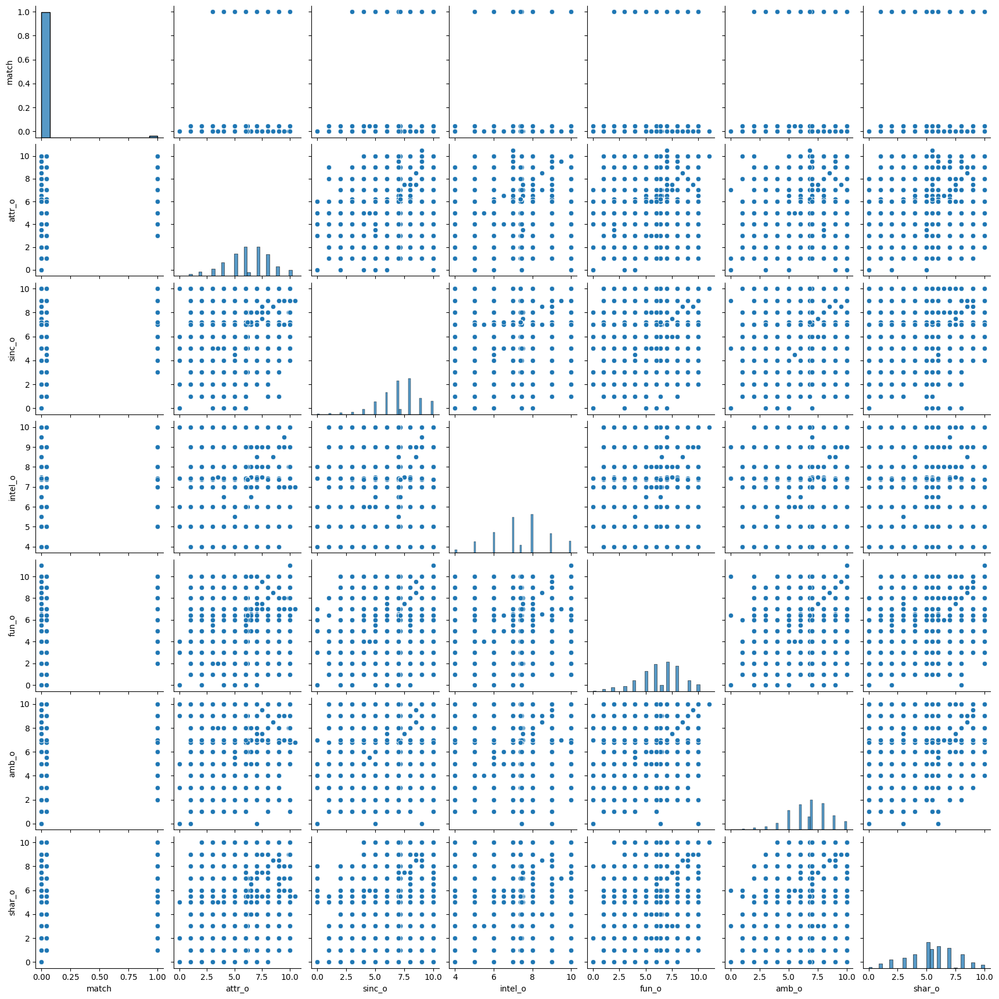

In [203]:
sns.pairplot(dating_df, vars=["match"] + attributes)
plt.show()

Through the heat map and the pair diagram we conclude that what influences love at first sight are the attributes they see in the opposite sex, which are attractiveness, serenity, intelligence, fun, ambition and shared interests. Of these attributes, the one that most influences love at first sight is fun.